# **ПРАКТИЧЕСКОЕ ЗАДАНИЕ**
Реализовать синтезирование лиц из LFW с помощью DCGAN.

Библиотеки: [Python, Tensorflow]

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds

#### **ЗАГРУЗКА ДАТАСЕТА LFW**

In [2]:
# tfds.disable_progress_bar()
(label_train, img_train), (label_test, img_test) = tfds.load( 
    'lfw',
    split=['train[:50%]', 'train[60%:70%]'],
    batch_size=-1,
    as_supervised=True,
    shuffle_files=True
)

In [3]:
print(f'Image size: {img_train.shape[1:]}')
print(f'Train exemples: {img_train.shape[0]}')
print(f'Test examples: {img_test.shape[0]}')

Image size: (250, 250, 3)
Train exemples: 6616
Test examples: 1323


#### **ВИЗУАЛИЗАЦИЯ ДАТАСЕТА LFW**

In [3]:
def plot_digits(samples):
    fig = plt.figure(figsize=(20, 12))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(5, 8, j + 1)
        ax.imshow(samples[j, ...])
        plt.xticks([]), plt.yticks([])
    plt.show()

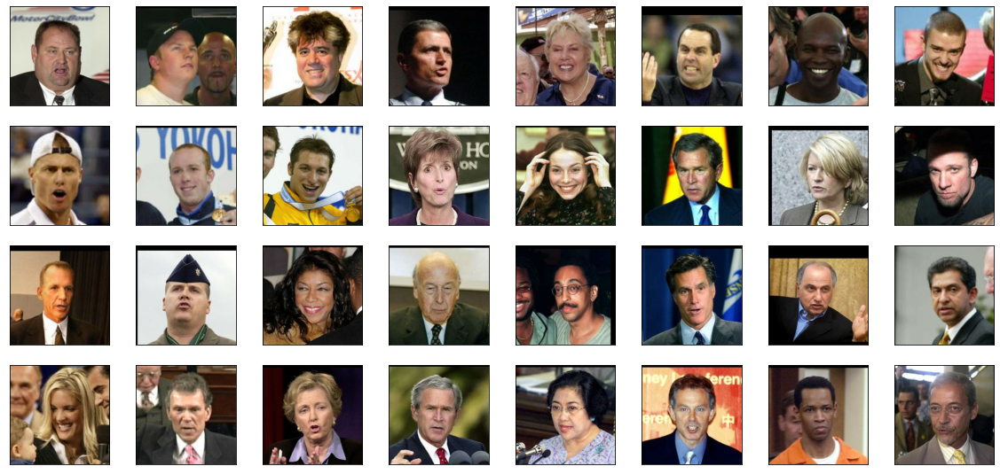

In [5]:
plot_digits(img_train[:32, ...])

#### **DEEP CONVOLUTIONAL GAN (DCGAN)**

In [15]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(256*8*8, activation='relu'),   # на входе вектор
    tf.keras.layers.Reshape((8, 8, 256)),
    tf.keras.layers.UpSampling2D((4, 4)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(0.2),    
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(64, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(0.2),    
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(32, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(0.2),   
    tf.keras.layers.Conv2D(3, (3, 3), padding='same', activation='sigmoid'),   # на выходе картинка
])


discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),   # на входе картинка
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.2),    
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1),   # выход класс
])


generator.build([16, 80])
generator.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (16, 16384)               1327104   
                                                                 
 reshape_6 (Reshape)         (16, 8, 8, 256)           0         
                                                                 
 up_sampling2d_18 (UpSamplin  (16, 32, 32, 256)        0         
 g2D)                                                            
                                                                 
 conv2d_48 (Conv2D)          (16, 32, 32, 128)         295040    
                                                                 
 batch_normalization_36 (Bat  (16, 32, 32, 128)        512       
 chNormalization)                                                
                                                                 
 leaky_re_lu_42 (LeakyReLU)  (16, 32, 32, 128)       

In [16]:
discriminator.build([32, 128, 128, 3])
discriminator.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_52 (Conv2D)          (32, 64, 64, 32)          896       
                                                                 
 leaky_re_lu_45 (LeakyReLU)  (32, 64, 64, 32)          0         
                                                                 
 dropout_24 (Dropout)        (32, 64, 64, 32)          0         
                                                                 
 conv2d_53 (Conv2D)          (32, 32, 32, 64)          18496     
                                                                 
 zero_padding2d_6 (ZeroPaddi  (32, 33, 33, 64)         0         
 ng2D)                                                           
                                                                 
 batch_normalization_39 (Bat  (32, 33, 33, 64)         256       
 chNormalization)                                    

#### **СОЗДАНИЕ ПАЙПЛАПЙНА ДАННЫХ**

In [11]:
# функция обрезки изображения
def resize_images(img):
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = tf.cast(img, tf.float32) / 255.
    return img

In [12]:
print(np.min(img_train), np.max(img_train))

0 255


In [17]:
IMG_SIZE = 128
INPUT_DIM = 80
NUM_EPOCHS = 30
HALF_BATCH_SIZE = 16
BATCH_SIZE = HALF_BATCH_SIZE * 2
LEARNING_RATE = 0.0005
AUTOTUNE = tf.data.AUTOTUNE

# общая обработка тренировочной выборки
train_ds = tf.data.Dataset.from_tensor_slices(img_train)
train_ds = train_ds.map(resize_images, num_parallel_calls=AUTOTUNE)
train_ds = train_ds.shuffle(buffer_size=img_train.shape[0])
train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

# оптимизатор и лосс
optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### **ОБУЧЕНИЕ DCGAN**

[Step  0] D Loss: 0.8721; G Loss: 0.7104
1/1 [==============================] - 0s 232ms/step


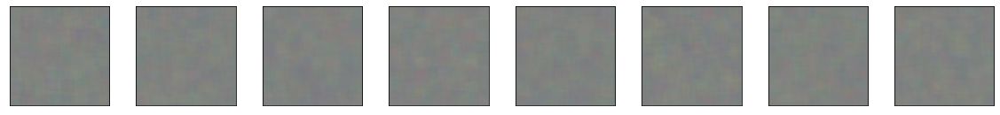

[Step 200] D Loss: 0.3164; G Loss: 9.5927
1/1 [==============================] - 0s 18ms/step


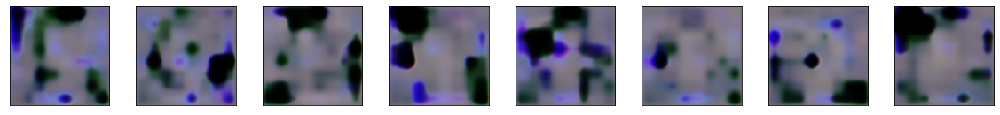

[Step 400] D Loss: 0.5458; G Loss: 16.4911
1/1 [==============================] - 0s 16ms/step


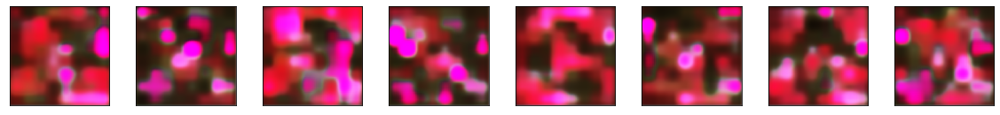

[Step 600] D Loss: 0.4898; G Loss: 9.9511
1/1 [==============================] - 0s 17ms/step


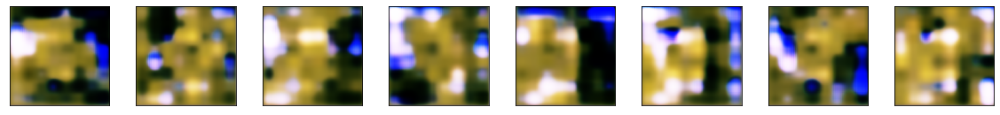

[Step 800] D Loss: 2.8369; G Loss: 17.8983
1/1 [==============================] - 0s 24ms/step


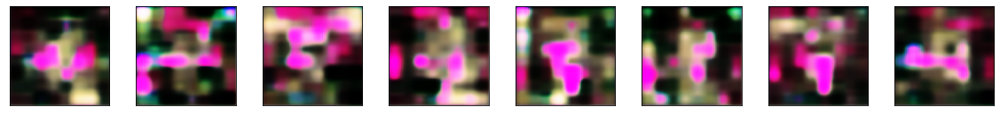

[Step 1000] D Loss: 0.0002; G Loss: 11.7470
1/1 [==============================] - 0s 16ms/step


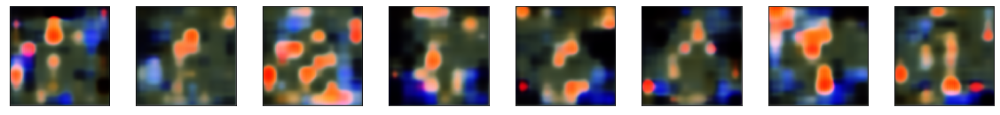

[Step 1200] D Loss: 0.3816; G Loss: 14.4561
1/1 [==============================] - 0s 17ms/step


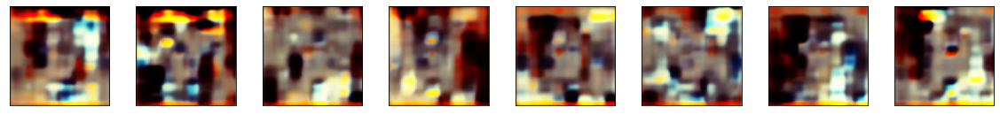

[Step 1400] D Loss: 0.8421; G Loss: 7.3469
1/1 [==============================] - 0s 18ms/step


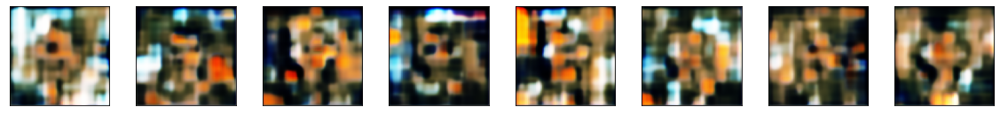

[Step 1600] D Loss: 1.4829; G Loss: 27.3709
1/1 [==============================] - 0s 17ms/step


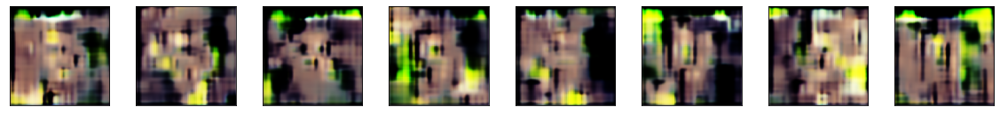

[Step 1800] D Loss: 0.4934; G Loss: 7.5420
1/1 [==============================] - 0s 26ms/step


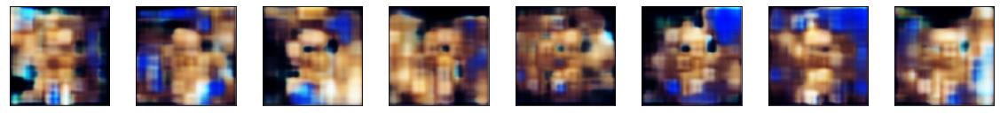

[Step 2000] D Loss: 0.9987; G Loss: 15.2329
1/1 [==============================] - 0s 16ms/step


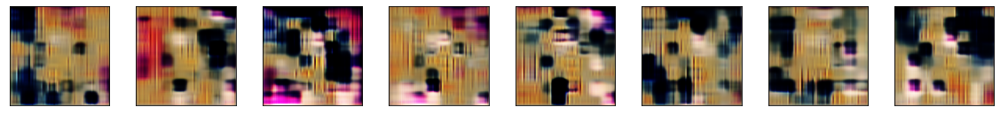

[Step 2200] D Loss: 0.1458; G Loss: 10.0270
1/1 [==============================] - 0s 18ms/step


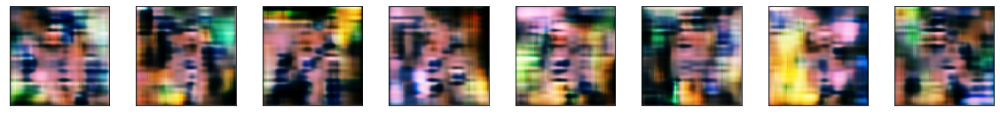

[Step 2400] D Loss: 0.0001; G Loss: 21.6121
1/1 [==============================] - 0s 16ms/step


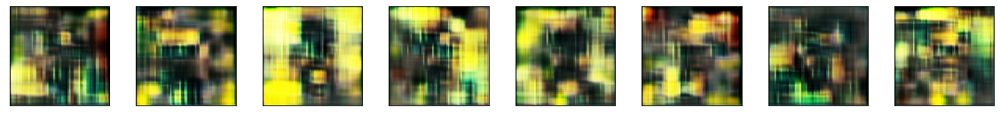

[Step 2600] D Loss: 0.1408; G Loss: 21.8218
1/1 [==============================] - 0s 16ms/step


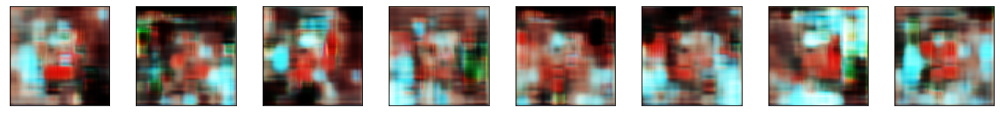

[Step 2800] D Loss: 0.5834; G Loss: 13.0532
1/1 [==============================] - 0s 18ms/step


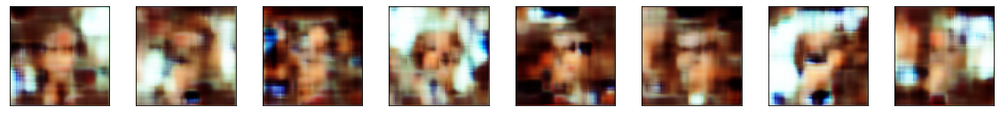

[Step 3000] D Loss: 0.9597; G Loss: 1.0046
1/1 [==============================] - 0s 27ms/step


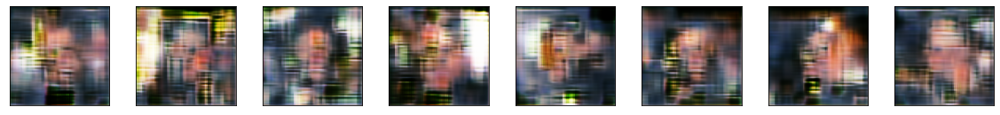

[Step 3200] D Loss: 0.4482; G Loss: 22.9602
1/1 [==============================] - 0s 16ms/step


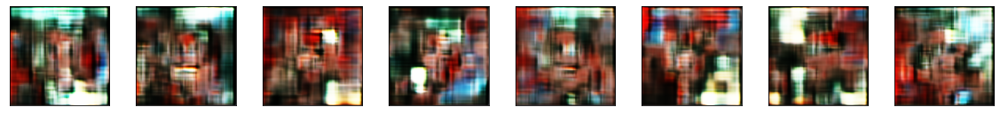

[Step 3400] D Loss: 0.0002; G Loss: 18.6142
1/1 [==============================] - 0s 17ms/step


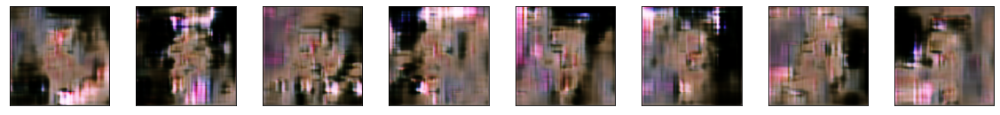

[Step 3600] D Loss: 0.2718; G Loss: 3.8002
1/1 [==============================] - 0s 19ms/step


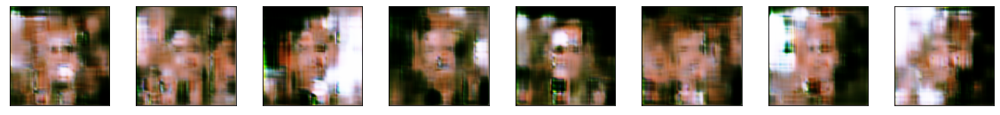

[Step 3800] D Loss: 0.0085; G Loss: 39.3152
1/1 [==============================] - 0s 17ms/step


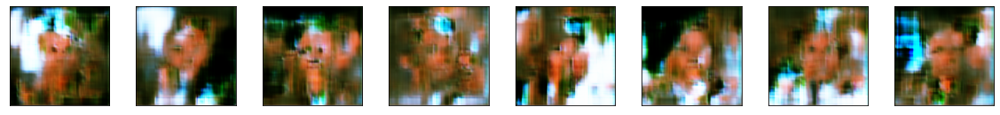

[Step 4000] D Loss: 0.7130; G Loss: 27.5267
1/1 [==============================] - 0s 17ms/step


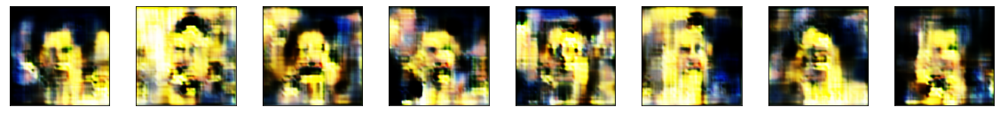

[Step 4200] D Loss: 0.0010; G Loss: 12.7318
1/1 [==============================] - 0s 17ms/step


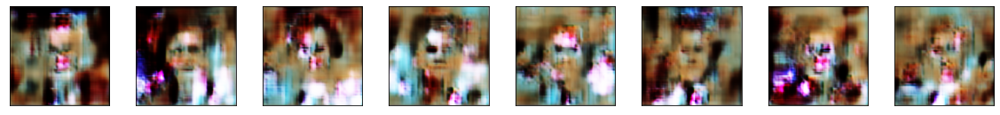

[Step 4400] D Loss: 0.5048; G Loss: 15.5780
1/1 [==============================] - 0s 26ms/step


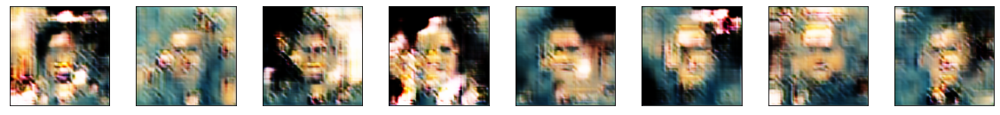

[Step 4600] D Loss: 0.0034; G Loss: 12.4811
1/1 [==============================] - 0s 17ms/step


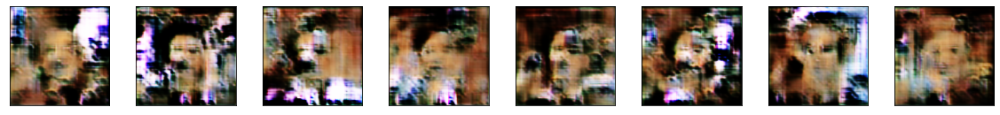

[Step 4800] D Loss: 0.1781; G Loss: 14.5886
1/1 [==============================] - 0s 17ms/step


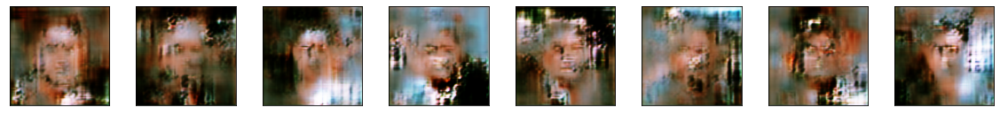

[Step 5000] D Loss: 0.3495; G Loss: 9.0490
1/1 [==============================] - 0s 17ms/step


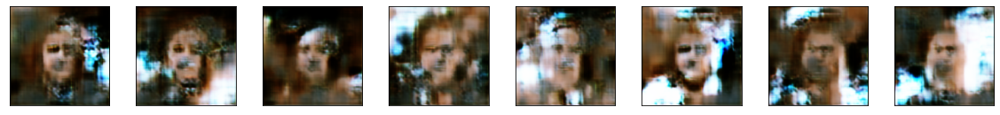

[Step 5200] D Loss: 0.0002; G Loss: 15.3477
1/1 [==============================] - 0s 17ms/step


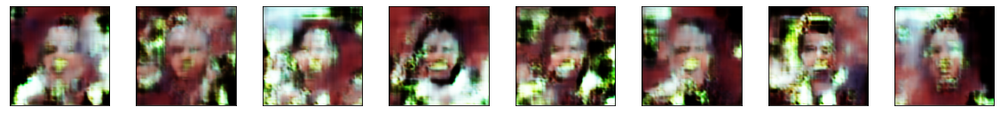

[Step 5400] D Loss: 0.2362; G Loss: 2.6521
1/1 [==============================] - 0s 16ms/step


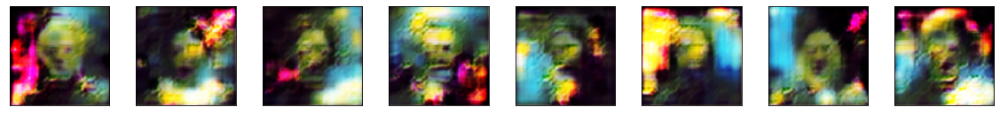

[Step 5600] D Loss: 0.2699; G Loss: 13.6104
1/1 [==============================] - 0s 19ms/step


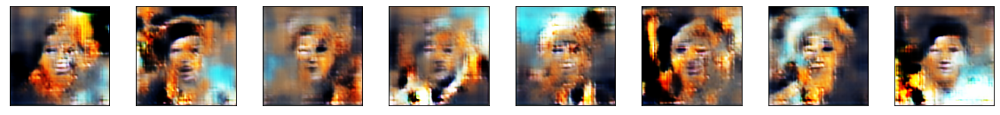

[Step 5800] D Loss: 0.0000; G Loss: 15.0556
1/1 [==============================] - 0s 25ms/step


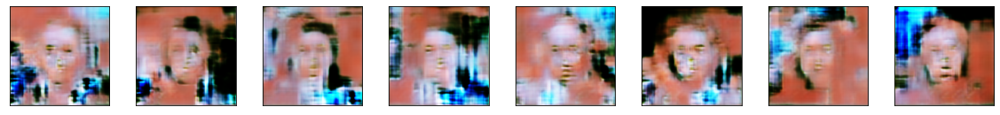

[Step 6000] D Loss: 0.0885; G Loss: 14.2896
1/1 [==============================] - 0s 32ms/step


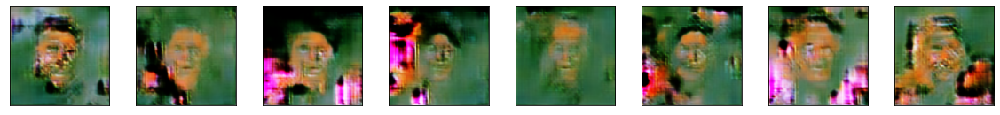

[Step 6200] D Loss: 0.0000; G Loss: 20.6725
1/1 [==============================] - 0s 16ms/step


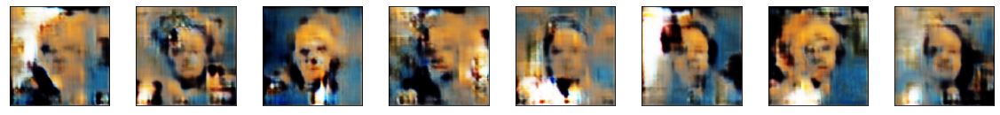

[Step 6400] D Loss: 0.7207; G Loss: 17.6009
1/1 [==============================] - 0s 18ms/step


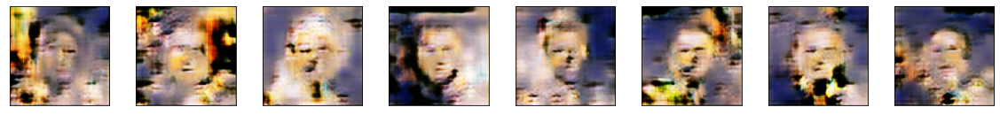

[Step 6600] D Loss: 0.2347; G Loss: 5.0142
1/1 [==============================] - 0s 16ms/step


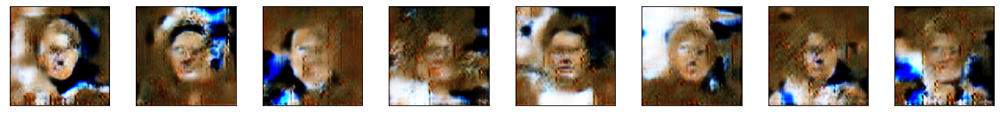

[Step 6800] D Loss: 0.0486; G Loss: 10.6153
1/1 [==============================] - 0s 16ms/step


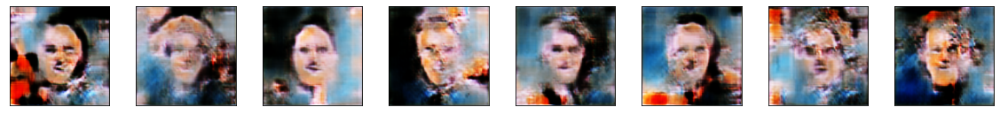

[Step 7000] D Loss: 0.0649; G Loss: 5.0931
1/1 [==============================] - 0s 20ms/step


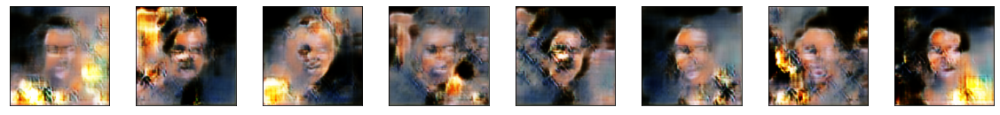

[Step 7200] D Loss: 0.5743; G Loss: 16.2099
1/1 [==============================] - 0s 25ms/step


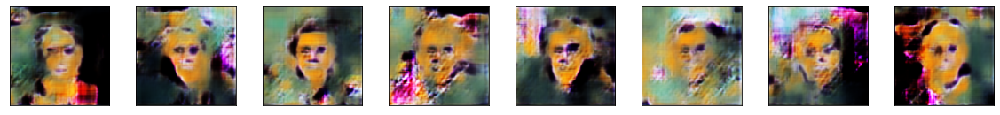

[Step 7400] D Loss: 0.2772; G Loss: 12.4381
1/1 [==============================] - 0s 16ms/step


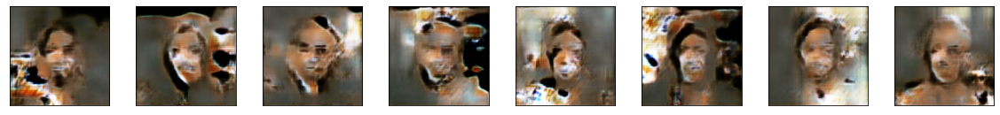

[Step 7600] D Loss: 0.1495; G Loss: 6.5343
1/1 [==============================] - 0s 17ms/step


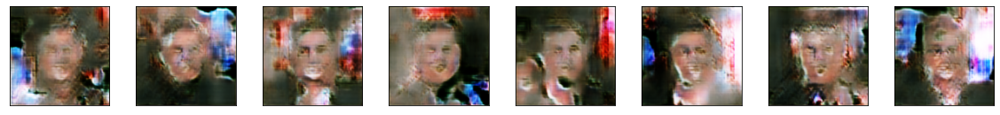

[Step 7800] D Loss: 0.4201; G Loss: 20.1511
1/1 [==============================] - 0s 17ms/step


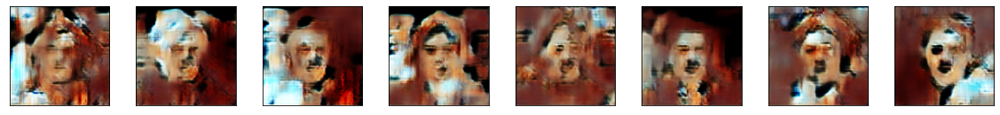

[Step 8000] D Loss: 1.1224; G Loss: 20.7041
1/1 [==============================] - 0s 19ms/step


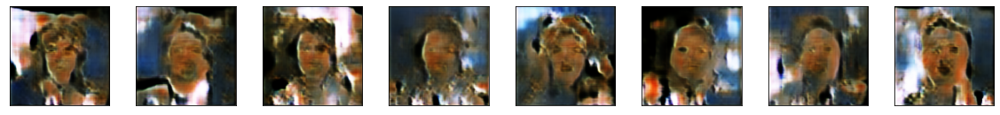

[Step 8200] D Loss: 0.0035; G Loss: 13.7084
1/1 [==============================] - 0s 18ms/step


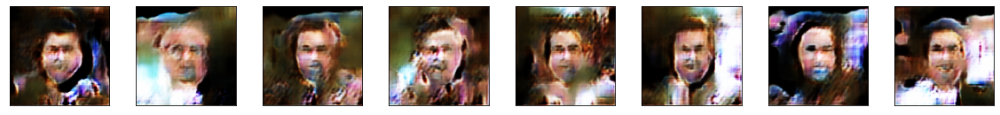

[Step 8400] D Loss: 0.2693; G Loss: 14.9337
1/1 [==============================] - 0s 16ms/step


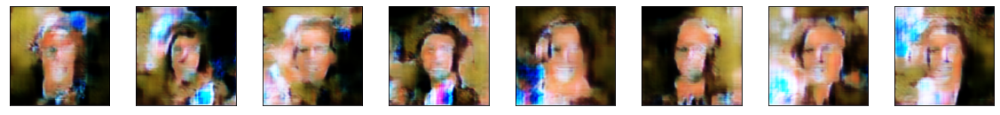

[Step 8600] D Loss: 0.0066; G Loss: 19.1275
1/1 [==============================] - 0s 31ms/step


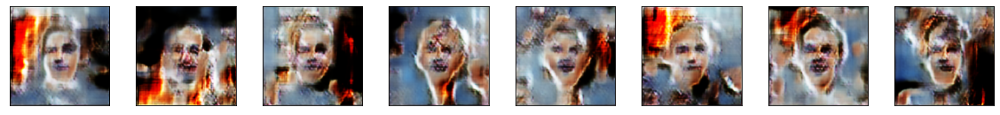

[Step 8800] D Loss: 0.2279; G Loss: 6.8723
1/1 [==============================] - 0s 16ms/step


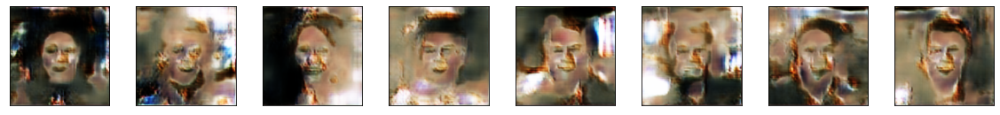

[Step 9000] D Loss: 0.2091; G Loss: 21.5707
1/1 [==============================] - 0s 16ms/step


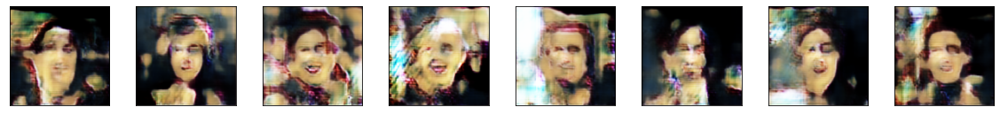

[Step 9200] D Loss: 0.0000; G Loss: 15.3656
1/1 [==============================] - 0s 17ms/step


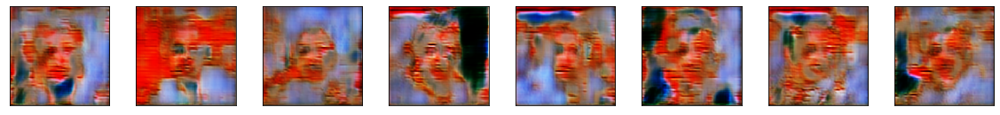

[Step 9400] D Loss: 0.0588; G Loss: 19.9056
1/1 [==============================] - 0s 17ms/step


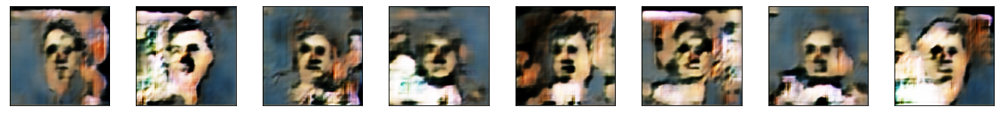

[Step 9600] D Loss: 0.0684; G Loss: 12.2956
1/1 [==============================] - 0s 16ms/step


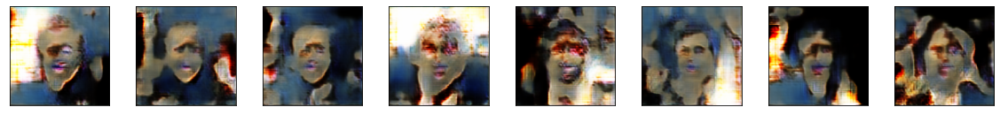

[Step 9800] D Loss: 0.1083; G Loss: 10.7673
1/1 [==============================] - 0s 30ms/step


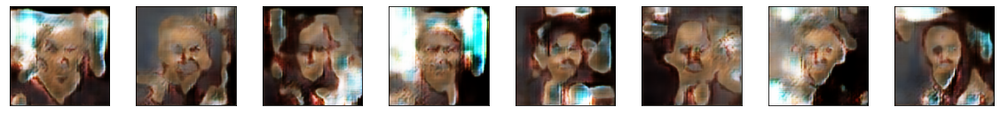

[Step 10000] D Loss: 0.1859; G Loss: 16.5070
1/1 [==============================] - 0s 17ms/step


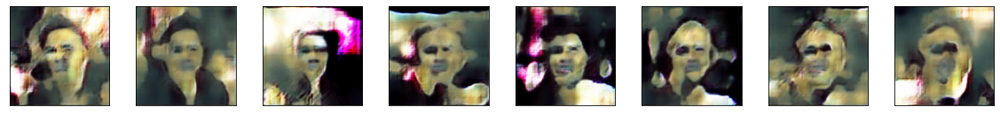

[Step 10200] D Loss: 0.0163; G Loss: 9.6015
1/1 [==============================] - 0s 18ms/step


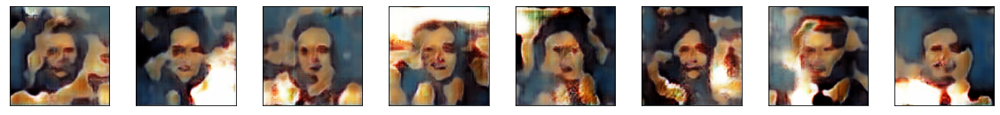

[Step 10400] D Loss: 0.1787; G Loss: 15.7845
1/1 [==============================] - 0s 16ms/step


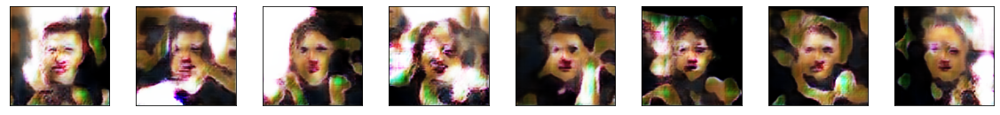

[Step 10600] D Loss: 0.3319; G Loss: 8.8078
1/1 [==============================] - 0s 16ms/step


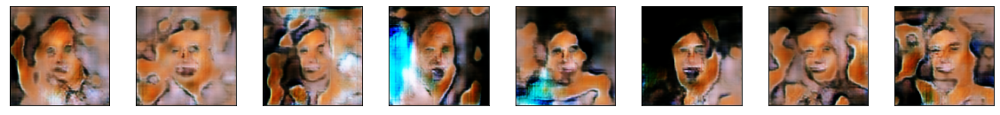

[Step 10800] D Loss: 0.0684; G Loss: 10.5524
1/1 [==============================] - 0s 16ms/step


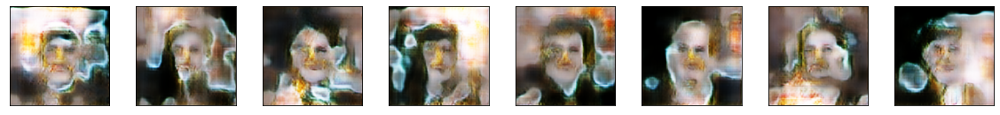

[Step 11000] D Loss: 0.1821; G Loss: 7.8417
1/1 [==============================] - 0s 23ms/step


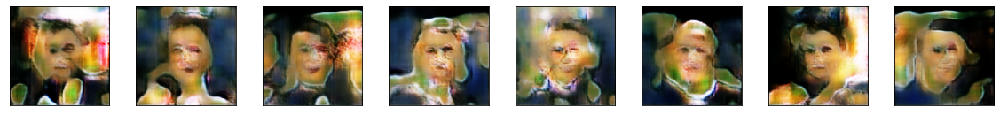

[Step 11200] D Loss: 0.0870; G Loss: 7.4272
1/1 [==============================] - 0s 18ms/step


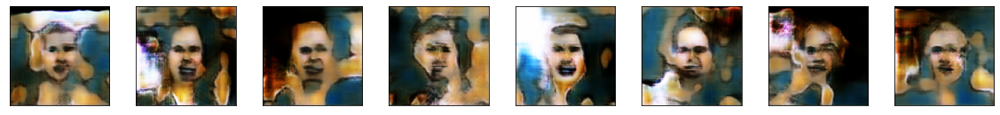

[Step 11400] D Loss: 0.0972; G Loss: 7.9465
1/1 [==============================] - 0s 16ms/step


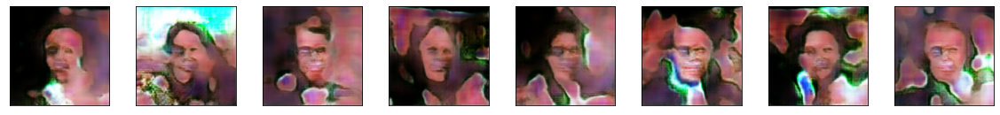

[Step 11600] D Loss: 0.3396; G Loss: 7.2083
1/1 [==============================] - 0s 24ms/step


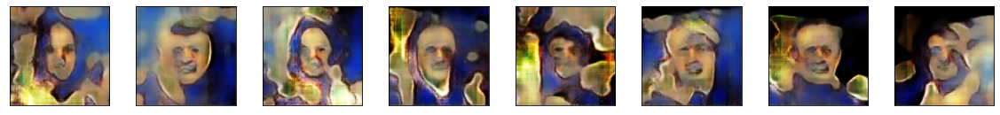

[Step 11800] D Loss: 0.3088; G Loss: 6.9609
1/1 [==============================] - 0s 16ms/step


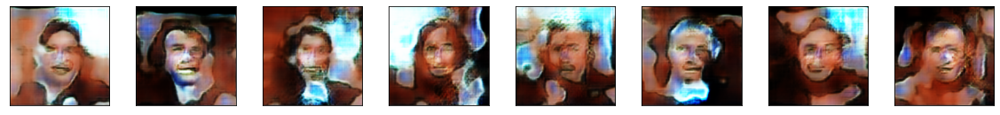

[Step 12000] D Loss: 0.4226; G Loss: 9.1908
1/1 [==============================] - 0s 16ms/step


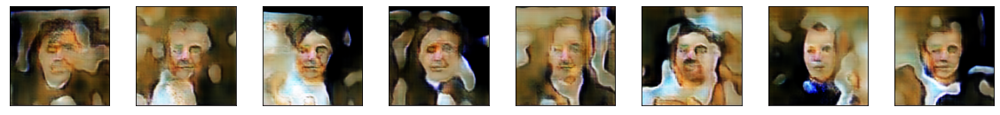

[Step 12200] D Loss: 0.4689; G Loss: 10.6187
1/1 [==============================] - 0s 16ms/step


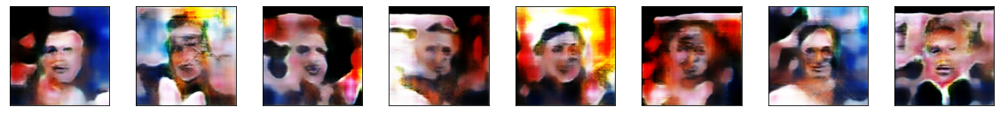

[Step 12400] D Loss: 0.2921; G Loss: 3.4259
1/1 [==============================] - 0s 16ms/step


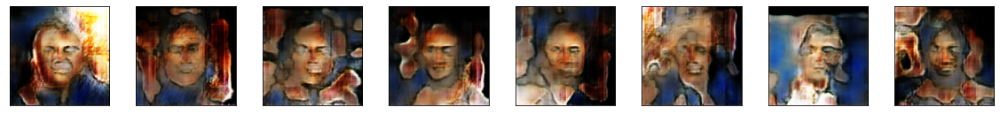

In [18]:
for step, true_images in enumerate(train_ds):
    
    # Train Discriminator
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise, verbose=0)
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined, training=True)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        syntetic = generator(noise, training=True)
        logits = discriminator(syntetic, training=False)
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Check intermediate results
    
    if step % 200 == 0:
        print('[Step %2d] D Loss: %.4f; G Loss: %.4f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        # print(np.min(syntetic_images), np.max(syntetic_images))
        # print(syntetic_images.shape)
        plot_digits(syntetic_images)


#### **ТЕСТИРОВАНИЕ СВЕРТОЧНОГО ГЕНЕРАТОРА**

1/1 [==============================] - 0s 19ms/step


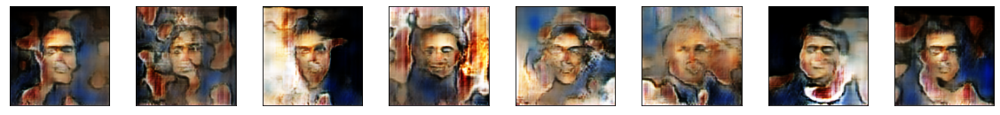

In [21]:
# сверточный GAN работает лучше чем полносвязный GAN или VAE
noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)
plot_digits(syntetic_images)

#### **ИНТЕРПОЛЯЦИЯ В ЛАТЕНТНОМ ПРОСТРАНСТВЕ**

1/1 [==============================] - 0s 18ms/step


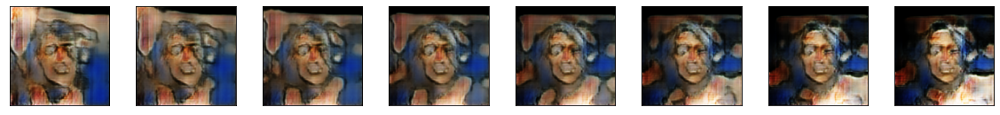

In [22]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
plot_digits(syntetic_images)

##### **ВЫВОД**

Архитектура DCGAN смогла уловить общие очертания человеческого лица, размещение глаз, носа и рта. К сожалению, до реалистичных фотографий достаточно далеко. Требуется дополнительное обучение и увеличение количества тренируемых параметров сети.